In [185]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline
import time
import itertools
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

In [6]:
data = pd.read_csv('data/Boston.csv').drop(columns='Unnamed: 0').dropna()
data

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


<Figure size 864x864 with 0 Axes>

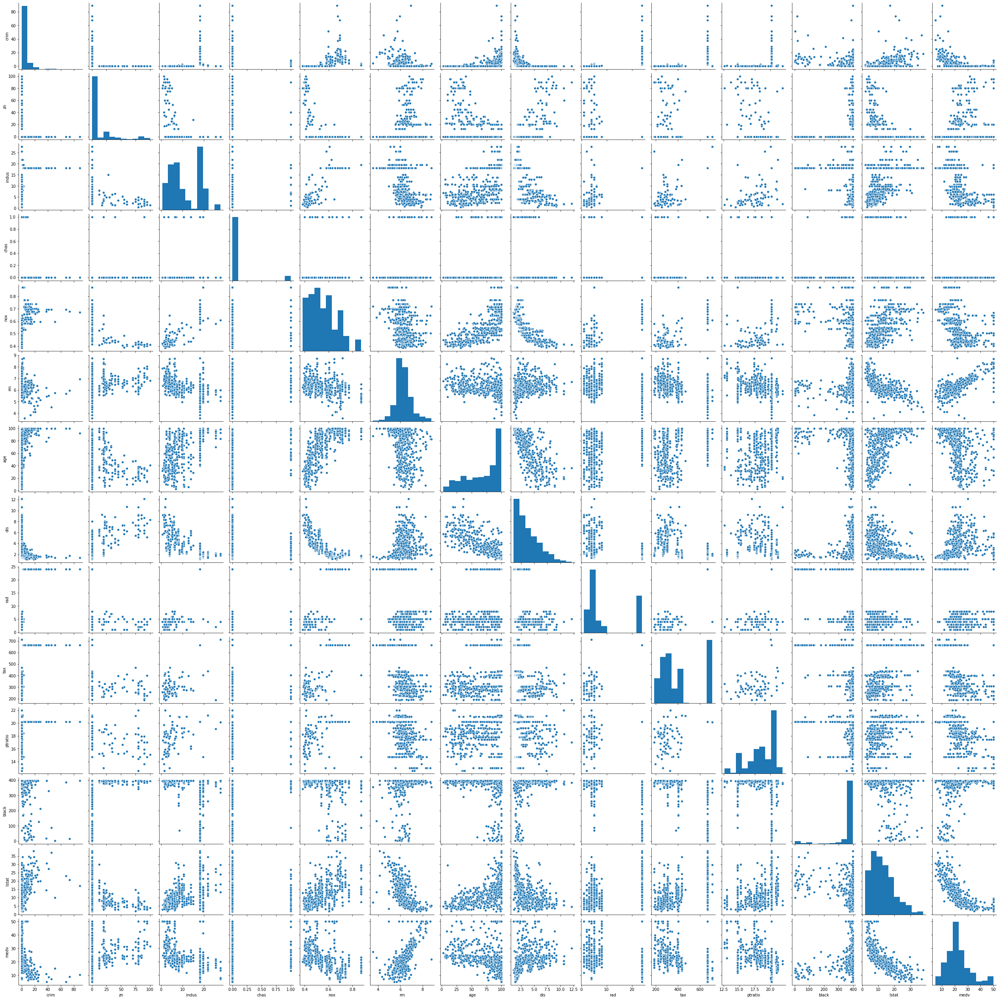

In [9]:
plt.figure(figsize=(12,12))
sb.pairplot(data);

In [212]:
data.corr()['crim']

crim       1.000000
zn        -0.200469
indus      0.406583
chas      -0.055892
nox        0.420972
rm        -0.219247
age        0.352734
dis       -0.379670
rad        0.625505
tax        0.582764
ptratio    0.289946
black     -0.385064
lstat      0.455621
medv      -0.388305
Name: crim, dtype: float64

In [20]:
# Preprocessing data
X = data.drop(columns='crim')
y = data['crim']

# Split train-test set
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, shuffle=False, random_state=None)

## Best subset selection

In [39]:
# Perform Best subset selection
def process_subset(feature_set, X, y):
    # Fit model on feature_set and calculate R2
    model = sm.OLS(y,sm.add_constant(X[list(feature_set)]))
    regr = model.fit()
    R2 = regr.rsquared

    # Return dict include model and useful information 
    return {'model': regr, 'features': list(feature_set), 'R2': R2}

In [40]:
def get_best_subset(k, X, y):
    
    # Want to create list of models with k predictors 
    results = []
    
    # Start counting time
    tic = time.time()
    
    # Process combinations features to create model & retult

    for feature_set in itertools.combinations(X.columns, k):
        results.append(process_subset(feature_set, X, y))
    
    # Wrap result up in a nice dataframe
    models = pd.DataFrame(results)
    
    # Choose the model with the highest R2
    best_model = models.loc[models['R2'].argmax()]
    
    toc = time.time()
    print("Processed {:5} models on {:2} predictors in {:6.2f} seconds.".format(models.shape[0], k, (toc-tic)))
    
    # Return the best model, along with some other useful information about the model
    return best_model

In [41]:
models_best = pd.DataFrame(columns=['model', 'features', 'R2'])

tic = time.time()
for i in range(1,len(X.columns)+1):
    models_best.loc[i] = get_best_subset(i, X_train, y_train)

toc = time.time()
print("Total elapsed time: {:.2f} seconds.".format((toc-tic)))

Processed    13 models on  1 predictors in   0.05 seconds.
Processed    78 models on  2 predictors in   0.16 seconds.
Processed   286 models on  3 predictors in   0.65 seconds.
Processed   715 models on  4 predictors in   1.67 seconds.
Processed  1287 models on  5 predictors in   3.80 seconds.
Processed  1716 models on  6 predictors in   4.95 seconds.
Processed  1716 models on  7 predictors in   5.21 seconds.
Processed  1287 models on  8 predictors in   4.12 seconds.
Processed   715 models on  9 predictors in   2.39 seconds.
Processed   286 models on 10 predictors in   0.96 seconds.
Processed    78 models on 11 predictors in   0.58 seconds.
Processed    13 models on 12 predictors in   0.05 seconds.
Processed     1 models on 13 predictors in   0.01 seconds.
Total elapsed time: 24.72 seconds.


In [42]:
def add_metrics_table(models):
    models['R2_adj'] = models.apply(lambda x: x['model'].rsquared_adj, axis=1)
    models['AIC'] = models.apply(lambda x: x['model'].aic, axis=1)
    models['BIC'] = models.apply(lambda x: x['model'].bic, axis=1)
add_metrics_table(models_best)

In [43]:
def display_chart_models(models, good_point):
    plt.figure(figsize=(12,12))

    # Plot R2
    plt.subplot(2,2,1)
    sb.lineplot(x=models.index, y=models['R2'])
    max_R2 = models['R2'].max()
    plt.plot(models[models['R2']==max_R2].index, max_R2, 'ro', label='Max R2')
    # Plot Reasonable point
    if good_point != max_R2:
        plt.scatter(good_point, models.loc[good_point, 'R2'], label='Good point: {:,.0f} at {} predictors'.format(models.loc[good_point, 'R2'], good_point))
        plt.scatter([], [], color='white', label='{}'.format(models.loc[good_point, 'features']))
    plt.legend()
    plt.xticks(models.index)

    # Plot R2_adj
    plt.subplot(2,2,2)
    sb.lineplot(x=models.index, y=models['R2_adj'])
    max_R2_adj = models['R2_adj'].max()
    plt.plot(models[models['R2_adj']==max_R2_adj].index, max_R2_adj, 'ro', label=' Max adj R2')
    # Plot Reasonable point
    if good_point != max_R2_adj:
        plt.scatter(good_point, models.loc[good_point, 'R2_adj'], label='Good point: {:,.0f} at {} predictors'.format(models.loc[good_point, 'R2_adj'], good_point))
        plt.scatter([], [], color='white', label='{}'.format(models.loc[good_point, 'features']))
    plt.legend()
    plt.xticks(models.index)

    # Plot AIC
    plt.subplot(2,2,3)
    sb.lineplot(x=models.index, y=models['AIC'])
    min_AIC = models['AIC'].min()
    plt.plot(models[models['AIC']==min_AIC].index, min_AIC, 'ro', label='Min AIC')
    # Plot Reasonable point
    if good_point != min_AIC:
        plt.scatter(good_point, models.loc[good_point, 'AIC'], label='Good point: {:,.0f} at {} predictors'.format(models.loc[good_point, 'AIC'], good_point))
        plt.scatter([], [], color='white', label='{}'.format(models.loc[good_point, 'features']))
    plt.legend()
    plt.xticks(models.index)

    # Plot BIC
    plt.subplot(2,2,4)
    sb.lineplot(x=models.index, y=models['BIC'])
    min_BIC = models['BIC'].min()
    plt.plot(models[models['BIC']==min_BIC].index, min_BIC, 'ro', label='Min BIC')
    # Plot Reasonable point
    if good_point != min_BIC:
        plt.scatter(good_point, models.loc[good_point, 'BIC'], label='Good point: {:,.0f} at {} predictors'.format(models.loc[good_point, 'BIC'], good_point))
        plt.scatter([], [], color='white', label='{}'.format(models.loc[good_point, 'features']))
    plt.legend()
    plt.xticks(models.index)

    plt.show()

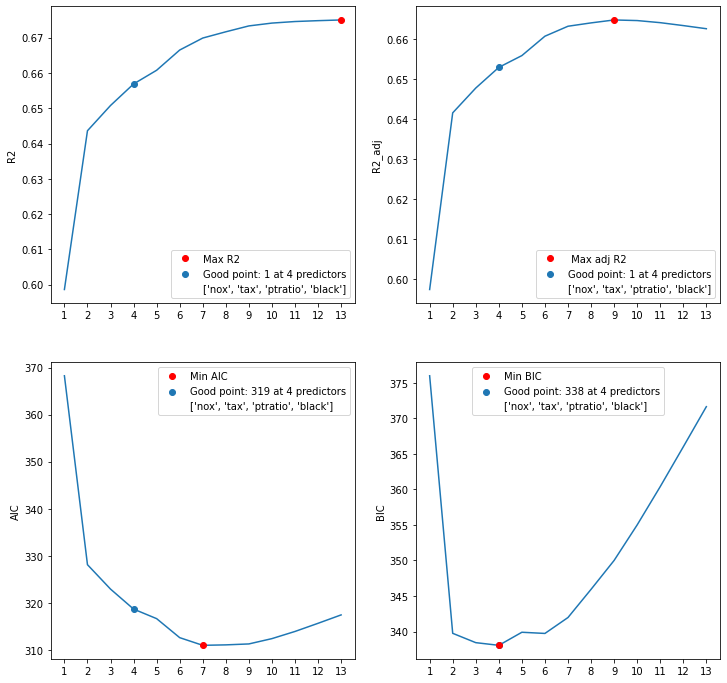

In [44]:
display_chart_models(models_best, 4)

In [208]:
# Choose number of model on BIC: 4 predictors
n_best_subset = 4

# Get Name feature + coef
best_subset_feature = models_best.loc[n_best_subset,'features']
best_subset_coef = list(models_best.loc[n_best_subset,'model'].params.iloc[1:])
best_subset_feature_value = ['{} : {:.3f}'.format(x, y) for x, y in zip(best_subset_feature, best_subset_coef)]

# Calculate test error MSE
best_subset_pred = models_best.loc[n_best_subset,'model'].predict(sm.add_constant(X_test[best_subset_feature]))
best_subset_mse = mean_squared_error(y_test, best_subset_pred)
best_subset_r2 = r2_score(y_test, best_subset_pred)

print("Test error of Best Subset Selection: {:,.0f}, R2: {:.4f}. Number predictors: {} - {}".format(best_subset_mse, best_subset_r2, n_best_subset, best_subset_feature_value))

Test error of Best Subset Selection: 253, R2: -0.5339. Number predictors: 4 - ['nox : 3.924', 'tax : 0.001', 'ptratio : -0.023', 'black : -0.003']


### R2 negative is not a wrong computational calculation, because R2 in sklearn calculate on formula: R2 = 1 - RSS/TSS, since RSS > TSS mean Sum squared error > sum all distance from its mean (constant model y = beta_0 = y_mean). 

### R2 negative mean very poor prediction power from model.

### R2 can be calculate on R2 = ESS/TSS and result R2 = 56%, positive but still indicate a very poor model

In [209]:
# Manual way to calculate
y_bar = np.mean(y_test)
tss = np.sum((y_test-y_bar)**2)
ess = np.sum((best_subset_pred-y_bar)**2)
rss = np.sum((y_test-best_subset_pred)**2)
ess/tss

0.5613047411503309

In [210]:
1-rss/tss

-0.5339228094000241

## Ridge Regression & Lasso

In [95]:
# Alphas range set-up
alphas = np.logspace(3, -5, 200)

In [96]:
# Run Ridge CV to calculate mse and identify best alpha
ridgecv = RidgeCV(alphas= alphas, normalize=True, store_cv_values=True).fit(X_train, y_train)
mse_ridge_cv = ridgecv.cv_values_.mean(axis=0)

# Best alpha
optimal_alpha_ridge_cv = ridgecv.alpha_

# Best MSE
optimal_mse_ridge_cv = np.abs(ridgecv.best_score_)

In [97]:
# Run Lasso CV to calculate mse and identify best alpha
lassocv = LassoCV(alphas= alphas, normalize=True, cv=10).fit(X_train, y_train)
mse_lasso_cv = lassocv.mse_path_.mean(axis=1)

# Best alpha
optimal_alpha_lasso_cv = lassocv.alpha_

# Best MSE
optimal_mse_lasso_cv = mse_lasso_cv.min()

In [98]:
# To be more visualize result of Ridge and Lasso in reducing number of predictors, create more function to get model result due to changes of alpha (lamda) and visualization

# Create Function result coefs Ridge or Lasso due to change of alpha (lamda)
def result_model(model, alphas, X, y):

    # Choose model
    if model == 'ridge':
        lm = Ridge(normalize= True)
    else:
        lm = Lasso(normalize= True)

    coefs = []

    # Run all model on range alphas
    for a in alphas:
        lm.set_params(alpha = a)
        lm.fit(X, y)
        coefs.append(lm.coef_)

    # Wrap in data frame with Collums names
    results = pd.DataFrame(coefs, columns=X.columns)
    
    return results

In [99]:
result_ridge = result_model('ridge', alphas, X_train, y_train)
result_lasso = result_model('lasso', alphas, X_train, y_train)

In [100]:
# Function visualize all coef of Result get above
def display_model(result_model, model, alphas, optimal_alpha, X, y):

    # Create threshold k where reduce significant coef beta
    if model == 'ridge':
        optimal_coef = Ridge(normalize=True).set_params(alpha = optimal_alpha).fit(X, y).coef_
    else:
        optimal_coef = Lasso(normalize=True).set_params(alpha = optimal_alpha).fit(X, y).coef_

    # Draw all feature coef of model
    for i in range(len(result_model.columns)):
        label = '{}  : {:.2f}'.format(result_model.columns[i], optimal_coef[i]) if np.abs(optimal_coef[i])> 0 else ''
        plt.plot(alphas, result_model.iloc[:,i], linewidth=3, label=label)

    # Draw a vertical line at threshold k
    plt.axvline(x=optimal_alpha, linestyle='--', linewidth=2, label='Optimal alpha : {:.4f}'.format(optimal_alpha))

    # Scale in log for easier to see, set x,ylabel, legend
    plt.xscale('log')
    plt.xlabel('alpha')
    plt.ylabel('Standardized Coef')
    plt.legend()

In [101]:
# Function display mse of model for easier to see range set alphas and optimal point good or not
def display_mse(mse_result, alphas, optimal_alpha=0, optimal_mse=0, scale_display='ticks'):

    # Plot MSE line
    plt.plot(alphas, mse_result, label='MSE')

    # Plot Min point
    plt.scatter(alphas[mse_result.argmin()], mse_result.min(), label='Min MSE: {:,.0f} at alpha: {:.4f}'.format(mse_result.min(), alphas[mse_result.argmin()]))
    
    # Plot Optimal point
    if optimal_alpha != 0:
        plt.scatter(optimal_alpha, optimal_mse, label='Optimal MSE: {:,.0f} at alpha: {:.4f}'.format(optimal_mse, optimal_alpha))

    if scale_display == 'log':      
        plt.xscale('log')
    if scale_display == 'ticks':
        plt.xticks(alphas)
    
    plt.xlabel('alpha')
    plt.ylabel('Mean Squared Error')
    plt.legend()

In [102]:
# Function display number predictors when change alpha (lambda)
def display_number_predictors_by_alpha(result_model, alphas, optimal_alpha):

    # Calculate number predictors follow by changes of alpha
    number_predictors = result_model.astype('bool').sum(axis=1)

    # Plot line, and optimal alpha
    plt.plot(alphas, number_predictors, label='Number Predictors')
    plt.axvline(x=optimal_alpha, linestyle='--', linewidth=2, label='Optimal alpha : {:.4f}'.format(optimal_alpha))

    plt.xscale('log')
    plt.yticks(np.arange(0,len(result_model.columns)+1))
    plt.legend()

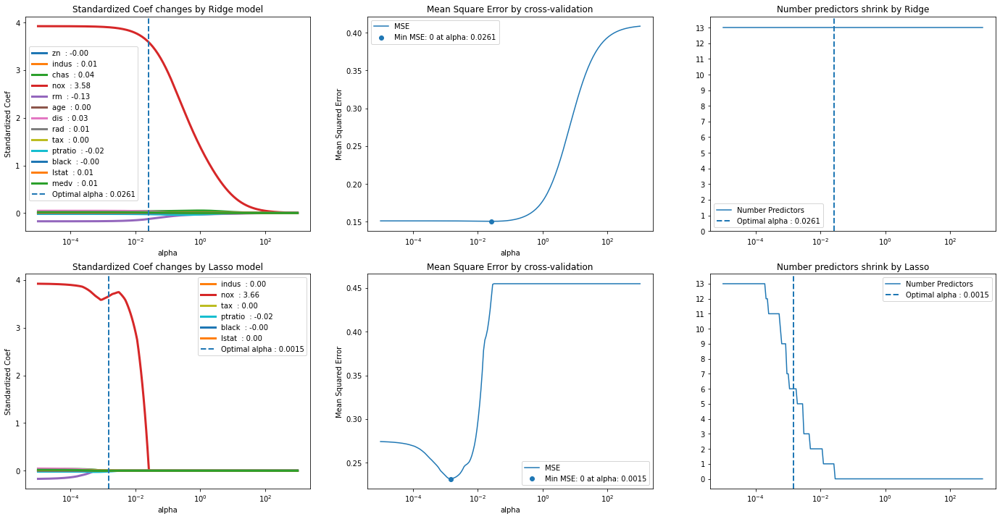

In [103]:
plt.figure(figsize=(24,12))

plot_1 = plt.subplot(2,3,1)
display_model(result_ridge, 'ridge', alphas, optimal_alpha_ridge_cv, X_train, y_train)
plt.title('Standardized Coef changes by Ridge model')

plot_2 = plt.subplot(2,3,2)
display_mse(mse_ridge_cv, alphas, scale_display='log')
plt.title('Mean Square Error by cross-validation')

plot_3 = plt.subplot(2,3,3)
display_number_predictors_by_alpha(result_ridge, alphas, optimal_alpha_ridge_cv)
plt.title('Number predictors shrink by Ridge')

plot_4 = plt.subplot(2,3,4)
display_model(result_lasso, 'lasso', alphas, optimal_alpha_lasso_cv, X_train, y_train)
plt.title('Standardized Coef changes by Lasso model')

plot_5 = plt.subplot(2,3,5)
display_mse(mse_lasso_cv, alphas, scale_display='log')
plt.title('Mean Square Error by cross-validation')

plot_6 = plt.subplot(2,3,6)
display_number_predictors_by_alpha(result_lasso, alphas, optimal_alpha_lasso_cv)
plt.title('Number predictors shrink by Lasso')

plt.show()

In [161]:
# Fit model Ridge with optimal alpha
ridgecv_op = RidgeCV(alphas = [optimal_alpha_ridge_cv], normalize=True, store_cv_values=True).fit(X_train, y_train)
ridgecv_op_pred = ridgecv_op.predict(X_test)

# Calculate test error Ridge
ridge_mse = mean_squared_error(y_test, ridgecv_op_pred)
ridge_r2 = r2_score(y_test, ridgecv_op_pred)

print("Test error of Ridge model: {:,.0f}".format(ridge_mse))

Test error of Ridge model: 250


In [162]:
# Fit model Lasso with optimal alpha
lassocv_op = LassoCV(alphas= [optimal_alpha_lasso_cv], normalize=True, cv=10).fit(X_train, y_train)

# Get number of predictors and coef
lasso_condition = lassocv_op.coef_ != 0
lassocv_op_num_predictors = np.sum(lasso_condition)
lassocv_op_name_predictors = ['{} : {:.3f}'.format(x, y) for x, y in zip(X.columns[lasso_condition], lassocv_op.coef_[lasso_condition])]

# Calculate test error Ridge
lassocv_op_pred = lassocv_op.predict(X_test)
lasso_mse = mean_squared_error(y_test, lassocv_op_pred)
lasso_r2 = r2_score(y_test, lassocv_op_pred)

print("Test error of Lasso model: {:,.0f}. Number predictors: {} - {}".format(lasso_mse, lassocv_op_num_predictors, lassocv_op_name_predictors))

Test error of Lasso model: 256. Number predictors: 6 - ['indus : 0.004', 'nox : 3.655', 'tax : 0.001', 'ptratio : -0.016', 'black : -0.003', 'lstat : 0.001']


## Principal Components Regression - PCR

In [141]:
mse_PCR = pd.Series([])

# Proccess Linear regression for each n principal components
for i in range(1,len(X.columns)+1):
    
    # Create pca with i components
    pca = PCA(n_components=i)
    P_current = pd.DataFrame(pca.fit_transform(X))

    # Create train-test on K-folds method, train data on principal components
    cv = KFold(n_splits=10, random_state=None, shuffle=False)
    
    # Create Linear OLS func
    lm = LinearRegression()
    
    # Short way to create mse array of all 10-Folds is using cross_val_score
    score = cross_val_score(lm, P_current, y, cv=cv, scoring='neg_mean_squared_error')

    # Add result to mse mean
    mse_PCR.loc[i] = np.mean(np.abs(score))

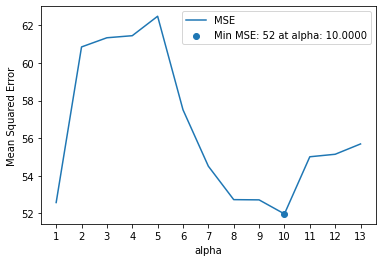

In [142]:
display_mse(mse_PCR, mse_PCR.index)

In [163]:
# Choose number principal components for PCR
n_pca = 10
pca = PCA(n_components=n_pca)
P_current = pd.DataFrame(pca.fit_transform(X))

P_train, P_test = train_test_split(P_current, train_size = 0.7, shuffle=False, random_state=None)

# Fit model
lm_p = LinearRegression(normalize=True, fit_intercept=True)
lm_p.fit(P_train, y_train)

# Calculate mse
lm_p_pred = lm_p.predict(P_test)
lm_p_mse = mean_squared_error(y_test, lm_p_pred)
lm_p_r2 = r2_score(y_test, lm_p_pred)

print("Test error of Principal Components Regression model: {:,.0f}, number components: {}".format(lm_p_mse, n_pca))

Test error of Principal Components Regression model: 244, number components: 10


## Partial Least Squared - PLS

In [144]:
mse_PLS = pd.Series([])

# Proccess PLS for each n components
for i in range(1,len(X.columns)+1):
    
    # Create PLS function
    pls = PLSRegression(n_components=i)

    # Create train-test on K-folds method, train data on principal components
    cv = KFold(n_splits=10, random_state=None, shuffle=False)
    
    # Short way to create mse array of all 10-Folds is using cross_val_score
    score = cross_val_score(pls, X, y, cv=cv, scoring='neg_mean_squared_error')

    # Add result to mse mean
    mse_PLS.loc[i] = np.mean(np.abs(score))

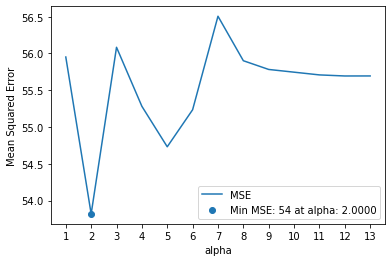

In [146]:
display_mse(mse_PLS, mse_PLS.index)

In [164]:
# Choose n PLS, seem good amount of predictors be reduced
n_pls = 2

pls = PLSRegression(n_components=n_pls)

# Fit model
pls.fit(X_train, y_train)

# Calculate mse
pls_pred = pls.predict(X_test)
pls_mse = mean_squared_error(y_test, pls_pred)
pls_r2 = r2_score(y_test, pls_pred)

print("Test error of Partial Least Squared model: {:,.0f}, number components: {}".format(pls_mse, n_pls))

Test error of Partial Least Squared model: 246, number components: 2


## Summary all results

In [165]:
print("Test error of Best Subset Selection : {:,.0f},  R2: {:.4f}. Number predictors: {} - {}".format(best_subset_mse, best_subset_r2, n_best_subset, best_subset_feature_value))
print("Test error of Ridge model           : {:,.0f},  R2: {:.4f}".format(ridge_mse, ridge_r2))
print("Test error of Lasso model           : {:,.0f},  R2: {:.4f}. Number predictors: {} - {}".format(lasso_mse, lasso_r2, lassocv_op_num_predictors, lassocv_op_name_predictors))
print("Test error of PCR model             : {:,.0f},  R2: {:.4f}, number components: {}".format(lm_p_mse, lm_p_r2, n_pca))
print("Test error of PLS model             : {:,.0f},  R2: {:.4f}, number components: {}".format(pls_mse, pls_r2, n_pls))

Test error of Best Subset Selection : 253,  R2: -0.5339. Number predictors: 4 - ['nox : 3.924', 'tax : 0.001', 'ptratio : -0.023', 'black : -0.003']
Test error of Ridge model           : 250,  R2: -0.5157
Test error of Lasso model           : 256,  R2: -0.5512. Number predictors: 6 - ['indus : 0.004', 'nox : 3.655', 'tax : 0.001', 'ptratio : -0.016', 'black : -0.003', 'lstat : 0.001']
Test error of PCR model             : 244,  R2: -0.4803, number components: 10
Test error of PLS model             : 246,  R2: -0.4906, number components: 2


### We can pick model with 4 predictors: Nox, tax, ptratio, black, or use PCR(10), PLS(2) less interpretation.

### But result R2 negative (for all 5 methods) very disapointed

### We should try another non-linear model or other kind of predictors for more relative to our response 'crim'